In [59]:
import os

import pandas as pd
import numpy as np

import librosa
import librosa.display
from librosa.util import fix_length

import matplotlib.pyplot as plt
from IPython.display import Audio
%matplotlib inline

In [60]:
pip install --user librosa

Note: you may need to restart the kernel to use updated packages.


In [61]:
raw,fr = librosa.load('./Downloads/Stromae-Alors_on_danse.mp3')
song = raw[350000:5000000]
song.shape
#Just because opus audio is not working on my jupyter notebook, I worked on mp3 audio.

(4650000,)

In [62]:
Audio(song,rate=fr)

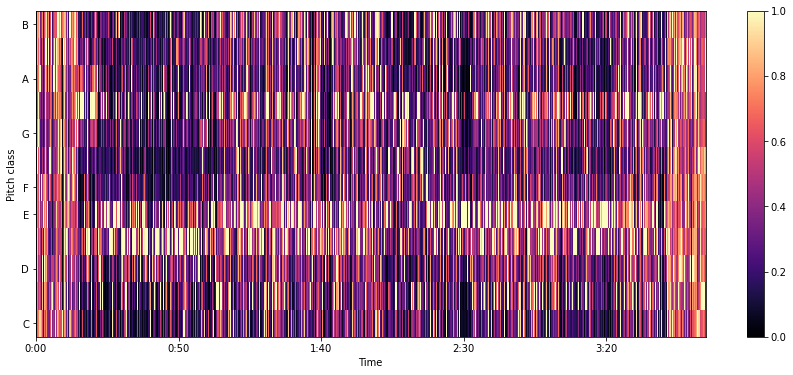

In [63]:
chromagram = librosa.feature.chroma_stft(y=raw, sr=fr)

plt.figure(figsize=(15, 6))
librosa.display.specshow(chromagram, y_axis='chroma', x_axis='time')
plt.colorbar()


In [64]:
chromagram_rounded = np.round(chromagram, 0)
chromagram_rounded

array([[0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 1., 0.],
       [0., 0., 0., ..., 1., 1., 0.],
       ...,
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.]], dtype=float32)

In [65]:
chromagram_rounded.shape


(12, 10115)

In [66]:
df = pd.DataFrame(chromagram_rounded.T, columns = ["1",'2','3',"4","5","6","7","8","9","10","11","12"])
df

,1,2,3,4,5,6,7,8,9,10,11,12
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
10110,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
10111,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
10112,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
10113,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [67]:
df.sum()

1     2795.0
2     3676.0
3     3486.0
4     5449.0
5     5947.0
6     2621.0
7     2520.0
8     3392.0
9     4870.0
10    2914.0
11    2939.0
12    3701.0
dtype: float32

<BarContainer object of 12 artists>

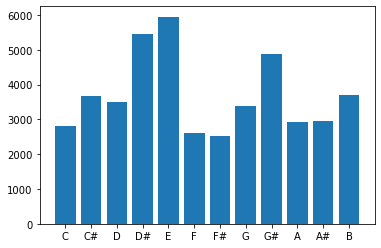

In [68]:
pitch_classes = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
plt.bar(pitch_classes, df.sum())

In [69]:
# E, D#, G#, B and C# are the top 5 note appearing in the song.